#### Segment Info
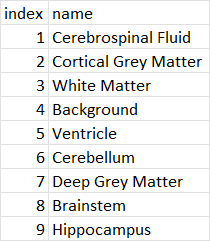

In [1]:
segments = [
    "Cerebrospinal Fluid",
    "Cortical Grey Matter",
    "White Matter",
    "Background",
    "Ventricle",
    "Cerebelum",
    "Deep Grey Matter",
    "Brainstem",
    "Hippocampus"
]

### Import Libraries

In [38]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.distributions as dist
from torchsummary import summary
import math
import os
import numpy as np
import time
import matplotlib.pyplot as plt
from prettytable import PrettyTable
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from pathlib import Path
import re
from skimage.metrics  import structural_similarity as ssim
import plotly.io as pio
import plotly.express as px
import pandas as pd

pio.renderers.default = 'iframe'

from importlib import reload


# locals
import model_architectures
import visualization
import unet

reload(model_architectures)
from model_architectures import VAESegment, Data3DSingleSegT2, SegMaskData

reload(unet)
from unet import UNet

reload(visualization)
from visualization import brain_diff, viz_slices

### Define Paths

In [15]:
research_dir = r"D:/school/research"
code_dir = os.path.join(research_dir, "code")
model_dir = os.path.join(code_dir, "explore_again", "models")
data_dir = os.path.join(research_dir, "data")
dhcp_rel2 = os.path.join(data_dir, "dhcp_rel2")
processed_dir = os.path.join(dhcp_rel2, "processed")
volume_dir = os.path.join(processed_dir, "volumes")
seg_dir = os.path.join(processed_dir, "segments")
seg_vol_dir = os.path.join(processed_dir, "volume_segments")
pred_dir = os.path.join(dhcp_rel2, "predictions")
seg_pred_dir = os.path.join(pred_dir, "vae_9seg")

l1_dir = os.path.join(volume_dir, "l1")
l5_dir = os.path.join(volume_dir, "l5")

l1_seg_dir = os.path.join(seg_dir, "l1")
l5_seg_dir = os.path.join(seg_dir, "l5")

l1_seg_vol_dir = os.path.join(seg_vol_dir, "l1")
l5_seg_vol_dir = os.path.join(seg_vol_dir, "l5")

l1_seg_pred_dir = os.path.join(seg_pred_dir, "l1")
l5_seg_pred_dir = os.path.join(seg_pred_dir, "l5")

### Helper Functions

In [16]:
def exclude_segments(seg, indices):
    seg_slice = seg.copy()
    seg_slice[np.isin(seg_slice, indices)] = 0
    seg_slice[seg_slice != 0] = 1
    
    return seg_slice

### Load Data

In [17]:
np.random.seed(42)
num_samples = int(len(os.listdir(l1_dir)) / 2)
samples = np.array([i for i in range(0, num_samples)])
np.random.shuffle(samples)

split_val = int(0.8 * num_samples)
train_indices = samples[0:split_val]
val_indices = samples[split_val:]

num_test = int(len(os.listdir(l5_dir)) / 2)
test_indices = np.array([i for i in range(0, num_test)])

In [18]:
train = Data3DSingleSegT2(l1_dir, l1_seg_vol_dir, train_indices, segment=1)
val = Data3DSingleSegT2(l1_dir, l1_seg_vol_dir, val_indices, segment=1)
test = Data3DSingleSegT2(l5_dir, l5_seg_vol_dir, test_indices, segment=1)

train_segments = SegMaskData(l1_seg_dir, train_indices)
val_segments = SegMaskData(l1_seg_dir, val_indices)
test_segments = SegMaskData(l5_seg_dir, test_indices)

batch_size = 1
train_loader = DataLoader(train, batch_size=batch_size)#, num_workers=1)
val_loader = DataLoader(val, batch_size=batch_size)#, num_workers=1)

### Run Segmented Model VAE

In [22]:
model = VAESegment(1, 1)

# model = nn.DataParallel(model)
model.cuda()
criterion = nn.MSELoss()
learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, eps=1e-07)

num_epochs = 100
# this works for batch size of 128, c=1
for epoch in range(num_epochs):
    total_loss = 0
    with tqdm(train_loader, unit="batch", ascii=' >=') as tepoch:
        model.train()
        data_counter = 0
        for data in tepoch:
            # clear gradients
            optimizer.zero_grad()
            
            # forward
            x, y = data
            x = x.cuda()
            y = y.cuda()
            output = model(x)
            loss = criterion(y, output)
            
            # backward
            loss.backward()
            optimizer.step()
            
            total_loss += loss.data
            data_counter += 1
        ## This is probably more memory efficient but doesn't appear necessary in this case
        # del x
        # del output
        # torch.cuda.empty_cache()
        
        total_loss /= data_counter
            
        tepoch.set_postfix(loss=loss.item())
        val_loss = 0
        model.eval()
        data_counter = 0
        for data in val_loader:
            with torch.no_grad():
                x, y = data
                x = x.cuda()
                y = y.cuda()
                output = model(x)
                loss = criterion(y, output)

                val_loss += loss.data
                data_counter += 1
        
        val_loss /= data_counter
        
        print('epoch [{}/{}], train_loss:{:.4f}, val_loss:{:.4f}'
              .format(epoch+1, num_epochs, total_loss, val_loss))

100%|=============================================================================| 166/166 [01:41<00:00,  1.64batch/s]


epoch [1/100], train_loss:0.0679, val_loss:0.0037


100%|=============================================================================| 166/166 [01:50<00:00,  1.50batch/s]


epoch [2/100], train_loss:0.0034, val_loss:0.0033


100%|=============================================================================| 166/166 [01:50<00:00,  1.50batch/s]


epoch [3/100], train_loss:0.0032, val_loss:0.0031


100%|=============================================================================| 166/166 [01:51<00:00,  1.49batch/s]


epoch [4/100], train_loss:0.0031, val_loss:0.0031


100%|=============================================================================| 166/166 [01:51<00:00,  1.49batch/s]


epoch [5/100], train_loss:0.0030, val_loss:0.0030


100%|=============================================================================| 166/166 [01:52<00:00,  1.48batch/s]


epoch [6/100], train_loss:0.0030, val_loss:0.0030


100%|=============================================================================| 166/166 [01:53<00:00,  1.47batch/s]


epoch [7/100], train_loss:0.0030, val_loss:0.0030


100%|=============================================================================| 166/166 [01:52<00:00,  1.47batch/s]


epoch [8/100], train_loss:0.0030, val_loss:0.0030


100%|=============================================================================| 166/166 [01:53<00:00,  1.47batch/s]


epoch [9/100], train_loss:0.0029, val_loss:0.0030


100%|=============================================================================| 166/166 [01:53<00:00,  1.46batch/s]


epoch [10/100], train_loss:0.0029, val_loss:0.0029


100%|=============================================================================| 166/166 [01:55<00:00,  1.44batch/s]


KeyboardInterrupt: 

### Try UNet

In [39]:
model = UNet(1, 1, 4)

# model = nn.DataParallel(model)
model.cuda()
criterion = nn.MSELoss()
learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, eps=1e-07)

num_epochs = 100
# this works for batch size of 128, c=1
for epoch in range(num_epochs):
    total_loss = 0
    with tqdm(train_loader, unit="batch", ascii=' >=') as tepoch:
        model.train()
        data_counter = 0
        for data in tepoch:
            # clear gradients
            optimizer.zero_grad()
            
            # forward
            x, y = data
            x = x.cuda()
            y = y.cuda()
            output = model(x)
            loss = criterion(y, output)
            
            # backward
            loss.backward()
            optimizer.step()
            
            total_loss += loss.data
            data_counter += 1
        ## This is probably more memory efficient but doesn't appear necessary in this case
        # del x
        # del output
        # torch.cuda.empty_cache()
        
        total_loss /= data_counter
            
        tepoch.set_postfix(loss=loss.item())
        val_loss = 0
        model.eval()
        data_counter = 0
        for data in val_loader:
            with torch.no_grad():
                x, y = data
                x = x.cuda()
                y = y.cuda()
                output = model(x)
                loss = criterion(y, output)

                val_loss += loss.data
                data_counter += 1
        
        val_loss /= data_counter
        
        print('epoch [{}/{}], train_loss:{:.4f}, val_loss:{:.4f}'
              .format(epoch+1, num_epochs, total_loss, val_loss))

100%|=============================================================================| 166/166 [04:30<00:00,  1.63s/batch]


epoch [1/100], train_loss:0.0478, val_loss:0.0301


100%|=============================================================================| 166/166 [04:34<00:00,  1.65s/batch]


epoch [2/100], train_loss:0.0315, val_loss:0.0218


100%|=============================================================================| 166/166 [04:34<00:00,  1.66s/batch]


epoch [3/100], train_loss:0.0236, val_loss:0.0205


100%|=============================================================================| 166/166 [04:49<00:00,  1.74s/batch]


epoch [4/100], train_loss:0.0173, val_loss:0.0110


100%|=============================================================================| 166/166 [04:53<00:00,  1.77s/batch]


epoch [5/100], train_loss:0.0123, val_loss:0.0089


100%|=============================================================================| 166/166 [04:49<00:00,  1.75s/batch]


epoch [6/100], train_loss:0.0086, val_loss:0.0062


100%|=============================================================================| 166/166 [04:52<00:00,  1.76s/batch]


epoch [7/100], train_loss:0.0059, val_loss:0.0048


100%|=============================================================================| 166/166 [04:47<00:00,  1.73s/batch]


epoch [8/100], train_loss:0.0041, val_loss:0.0036


100%|=============================================================================| 166/166 [04:51<00:00,  1.76s/batch]


epoch [9/100], train_loss:0.0028, val_loss:0.0026


100%|=============================================================================| 166/166 [04:53<00:00,  1.77s/batch]


epoch [10/100], train_loss:0.0020, val_loss:0.0019


100%|=============================================================================| 166/166 [04:47<00:00,  1.73s/batch]


epoch [11/100], train_loss:0.0016, val_loss:0.0016


100%|=============================================================================| 166/166 [04:46<00:00,  1.73s/batch]


epoch [12/100], train_loss:0.0014, val_loss:0.0016


 95%|========================================================================>    | 157/166 [04:30<00:15,  1.72s/batch]


KeyboardInterrupt: 

### Save Model

In [33]:
model_path = os.path.join(model_dir, "vae_rel2t2_seg1.pt")
torch.save(model.state_dict(), model_path)

### Load Model

In [7]:
model_path = os.path.join(model_dir, "vae_rel2t2_segmented.pt")
model = VAESegment(1, 9)
model.load_state_dict(torch.load(model_path))
model.cuda()
model.eval()

VAESegment(
  (model): Sequential(
    (0): ResnetEncoder(
      (pass1): Sequential(
        (0): InstanceNorm3d(1, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (pass2): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (conv_bypass): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(4, 4, 4))
      (activation_bypass): ReLU()
    )
    (1): ResnetEncoder(
      (pass1): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (pass2): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0

### Get Losses

In [79]:
%%time

train_losses = []
train_seg_losses = []
criterion = nn.MSELoss()
for idx, img in enumerate(train):
    x = torch.Tensor(np.reshape(img[0], (1, 1, 256, 256, 256))).cuda()
    output = model(x)
    og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
    pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
    
    train_seg_losses.append(((img[1] - pred)**2).mean(axis=(1,2,3)))
    train_losses.append(float(criterion(torch.Tensor(og), torch.Tensor(np.sum(pred, axis=0)))))

CPU times: total: 21min 1s
Wall time: 3min 31s


In [60]:
%%time

val_losses = []
val_seg_losses = []
criterion = nn.MSELoss()
for idx, img in enumerate(val):
    x = torch.Tensor(np.reshape(img[0], (1, 1, 256, 256, 256))).cuda()
    output = model(x)
    og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
    pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
    
    val_seg_losses.append(((img[1] - pred)**2).mean(axis=(1,2,3)))
    val_losses.append(float(criterion(torch.Tensor(og), torch.Tensor(np.sum(pred, axis=0)))))

CPU times: total: 5min 10s
Wall time: 50.8 s


In [78]:
%%time

test_losses = []
test_seg_losses = []
criterion = nn.MSELoss()
for idx, img in enumerate(test):
    x = torch.Tensor(np.reshape(img[0], (1, 1, 256, 256, 256))).cuda()
    output = model(x)
    og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
    pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
    
    test_seg_losses.append(((img[1] - pred)**2).mean(axis=(1,2,3)))
    test_losses.append(float(criterion(torch.Tensor(og), torch.Tensor(np.sum(pred, axis=0)))))

CPU times: total: 3min 21s
Wall time: 34.4 s


In [125]:
segment_label = []
run_name = []
values = []

def get_values(list_o_vals, run_name):
    s = []
    v = []
    r = []
    for m in list_o_vals:
        for idx, n in enumerate(m):
            s.append(segments[idx])
            v.append(n)
            r.append(run_name)
    return s, v, r

train_labels, train_values, train_runs = get_values(train_seg_losses, "Train")
val_labels, val_values, val_runs = get_values(val_seg_losses, "Val")
test_labels, test_values, test_runs = get_values(test_seg_losses, "Test")

values.extend(train_values)
run_name.extend(train_runs)
segment_label.extend(train_labels)

values.extend(val_values)
run_name.extend(val_runs)
segment_label.extend(val_labels)

values.extend(test_values)
run_name.extend(test_runs)
segment_label.extend(test_labels)

segment_df = pd.DataFrame({"run": run_name, "segment": segment_label, "values": values})

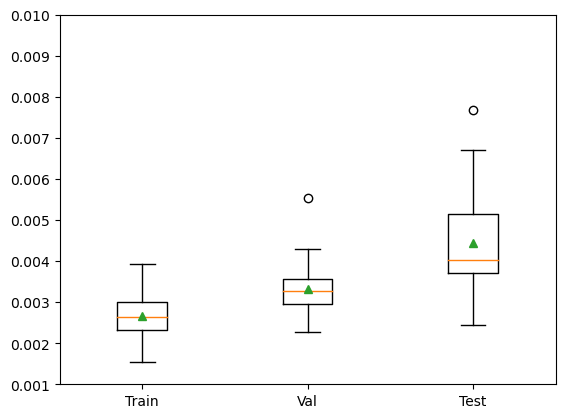

In [140]:
plt.ylim(0.001, 0.01)
bp = plt.boxplot(
    [train_losses, val_losses, test_losses],
    vert=True,
    labels=['Train', 'Val', 'Test'],
    showfliers=True,
    showmeans=True
)

### Train Results UNet

D:\school\research\code\explore_again\modeling\segment_recreation\visualization.py:92: UserWarning:

Trying to register the cmap 'above_mean' which already exists.

D:\school\research\code\explore_again\modeling\segment_recreation\visualization.py:99: UserWarning:

Trying to register the cmap 'below_mean' which already exists.



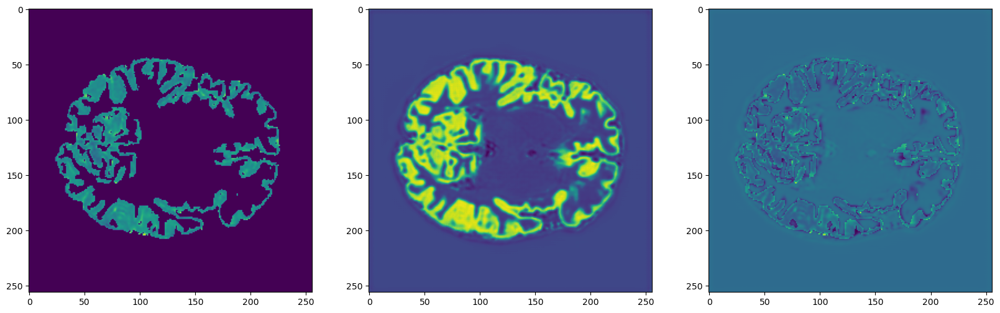

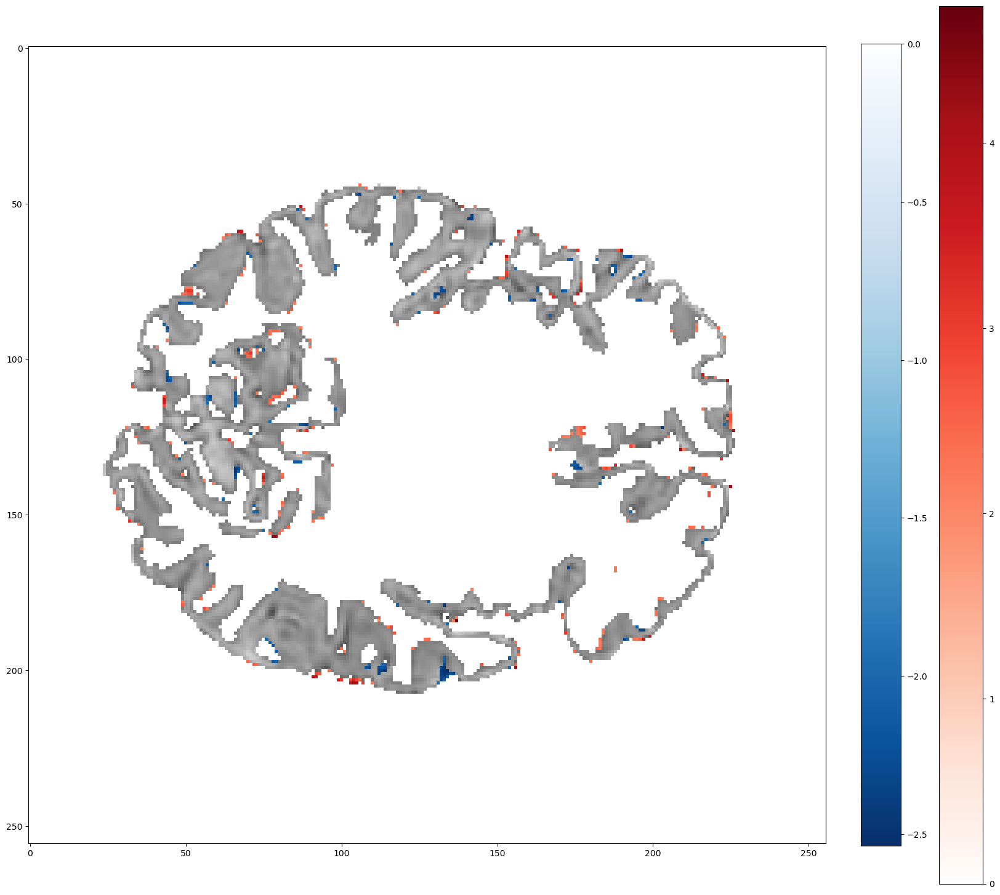

In [45]:
index = 0
x = torch.Tensor(np.reshape(train[index][0], (1, 1, 256, 256, 256))).cuda()
y = np.reshape(train[index][1], (256, 256, 256))
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (256, 256, 256))

s = 128

# exclude csf and background
# seg = train_segments[index]
# seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
# og_slc = og[:,:,s] * seg_slice
# pred_slc = pred[:,:,s] * seg_slice

# (score, diff) = ssim(og_slc, pred_slc, full=True)
# print("SSIM: ", score)


fig, ax = plt.subplots(1, 3, figsize=(20,20))
ax[0].imshow(y[:,:,s])
ax[1].imshow(pred[:,:,s])
ax[2].imshow(y[:,:,s] - pred[:,:,s])

brain_diff(y[:,:,128], pred[:,:,128], threshold=2)
# full_seg = exclude_segments(seg, [1, 4, 5])
# viz_slices(og * full_seg, pred * full_seg)

### Test Results UNet

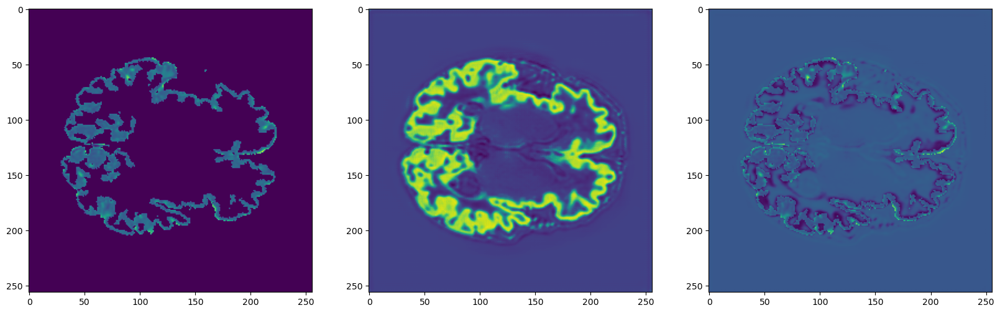

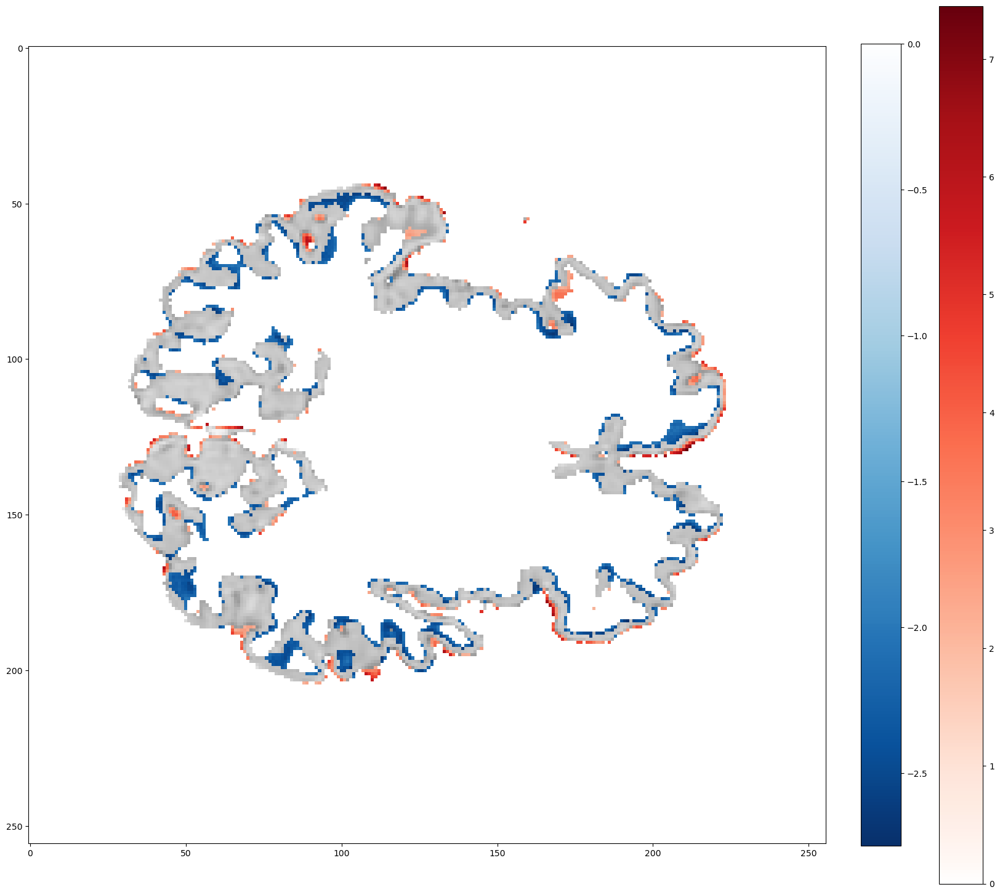

In [53]:
index = 7
x = torch.Tensor(np.reshape(test[index][0], (1, 1, 256, 256, 256))).cuda()
y = np.reshape(test[index][1], (256, 256, 256))
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (256, 256, 256))

s = 128

# exclude csf and background
# seg = train_segments[index]
# seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
# og_slc = og[:,:,s] * seg_slice
# pred_slc = pred[:,:,s] * seg_slice

# (score, diff) = ssim(og_slc, pred_slc, full=True)
# print("SSIM: ", score)


fig, ax = plt.subplots(1, 3, figsize=(20,20))
ax[0].imshow(y[:,:,s])
ax[1].imshow(pred[:,:,s])
ax[2].imshow(y[:,:,s] - pred[:,:,s])

brain_diff(y[:,:,128], pred[:,:,128], threshold=2)
# full_seg = exclude_segments(seg, [1, 4, 5])
# viz_slices(og * full_seg, pred * full_seg)

### Train Results VAE

ValueError: too many values to unpack (expected 2)

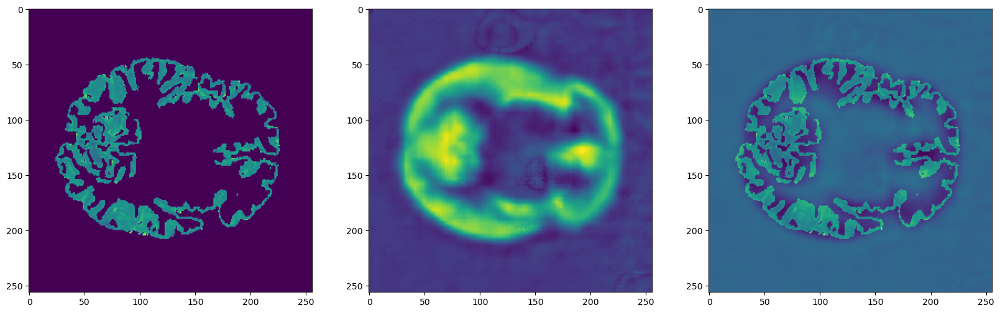

In [32]:
index = 0
x = torch.Tensor(np.reshape(train[index][0], (1, 1, 256, 256, 256))).cuda()
y = np.reshape(train[index][1], (256, 256, 256))
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (256, 256, 256))

s = 128

# exclude csf and background
# seg = train_segments[index]
# seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
# og_slc = og[:,:,s] * seg_slice
# pred_slc = pred[:,:,s] * seg_slice

# (score, diff) = ssim(og_slc, pred_slc, full=True)
# print("SSIM: ", score)


fig, ax = plt.subplots(1, 3, figsize=(20,20))
ax[0].imshow(y[:,:,s])
ax[1].imshow(pred[:,:,s])
ax[2].imshow(y[:,:,s] - pred[:,:,s])

brain_diff(y, pred)
# full_seg = exclude_segments(seg, [1, 4, 5])
# viz_slices(og * full_seg, pred * full_seg)

In [31]:
brain_diff

<function visualization.brain_diff(a, b, threshold=3, self_stand=False, mean=0, std=0.1)>

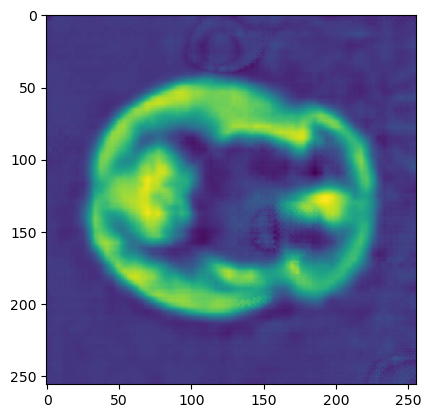

In [25]:
plt.imshow(pred[:,:,128])

SSIM:  0.9355436882708072


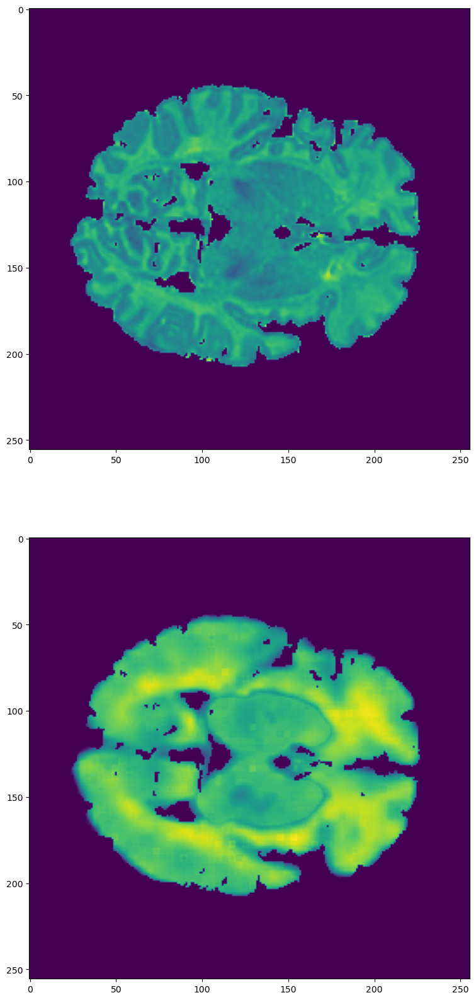

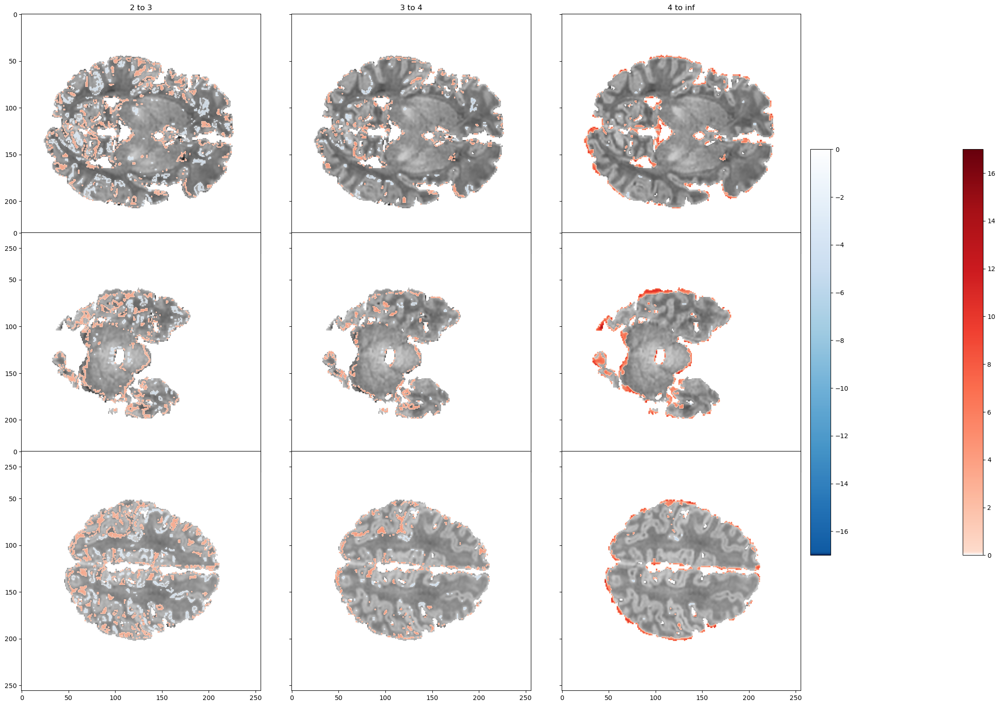

In [71]:
### THIS METHOD EXCLUDES THE SEGMENTED OUTPUT SLICES SO THAT SIGNAL IS NOT PART OF HTE DIFFERENCE

index = 0
x = torch.Tensor(np.reshape(train[index][0], (1, 1, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred_all = np.sum(pred, axis=0)
pred = np.delete(pred, [0, 3, 4], axis=0)
pred = np.sum(pred, axis=0)

s = 128

# exclude csf and background
seg = train_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)

fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og * full_seg, pred * full_seg)

### Val Results

SSIM:  0.9319610347543024


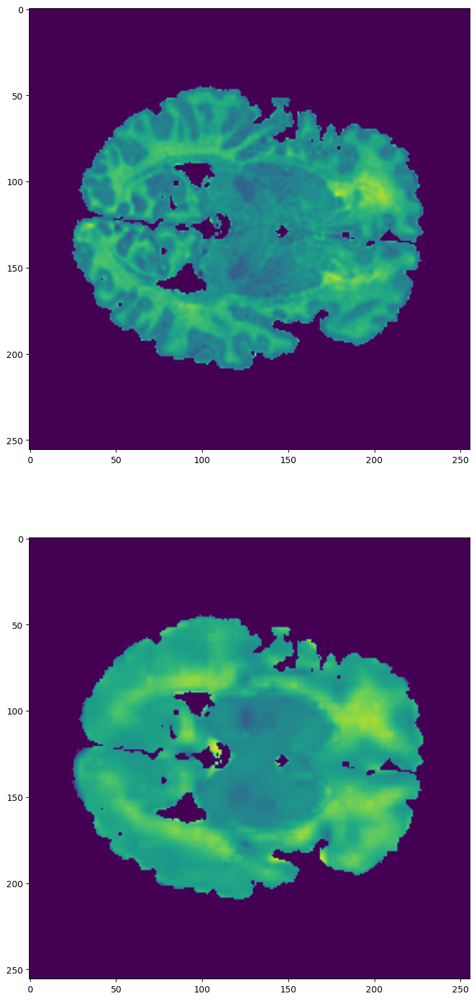

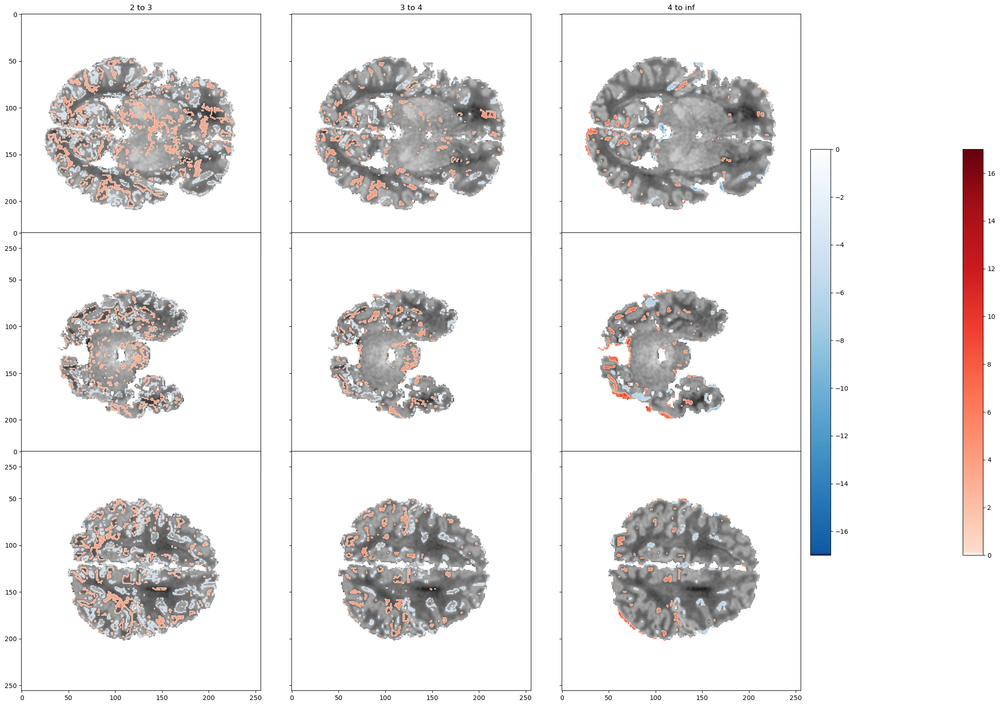

In [22]:
index = 1
x = torch.Tensor(np.reshape(val[index][0], (1, 1, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred = np.sum(pred, axis=0)

s = 128

# exclude csf and background
seg = val_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)


fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og * full_seg, pred * full_seg)

SSIM:  0.9170731318168938


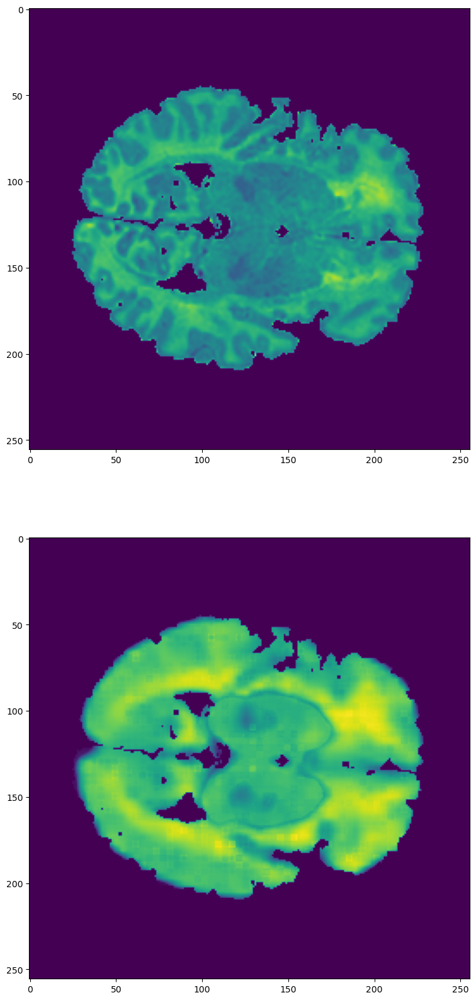

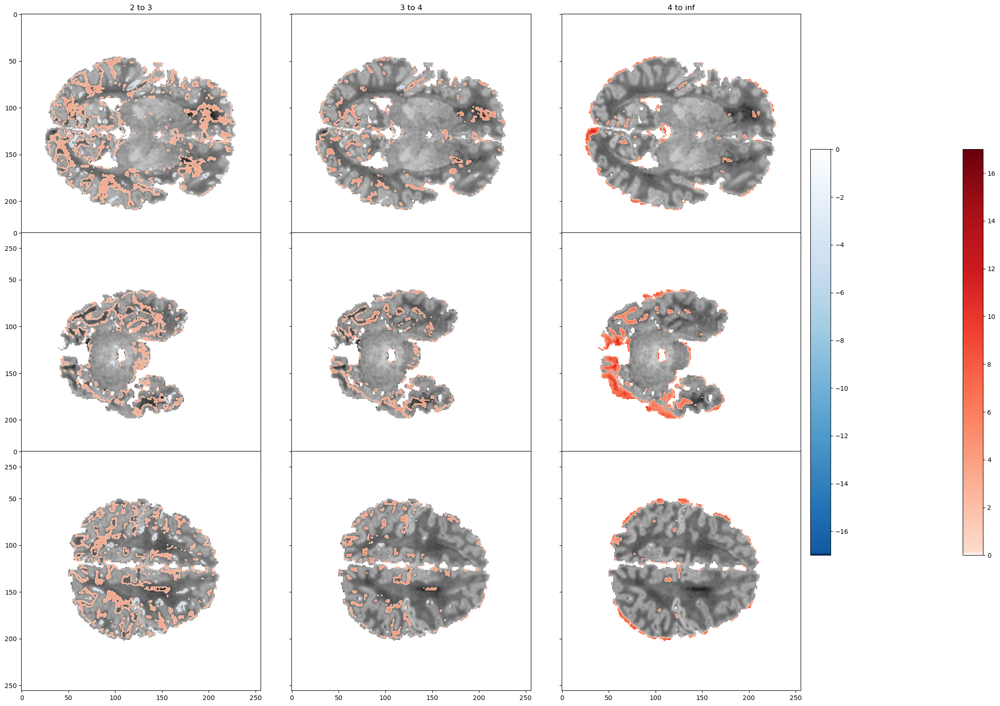

In [68]:
### THIS METHOD EXCLUDES THE SEGMENTED OUTPUT SLICES SO THAT SIGNAL IS NOT PART OF HTE DIFFERENCE

index = 1
x = torch.Tensor(np.reshape(val[index][0], (1, 1, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred_all = np.sum(pred, axis=0)
pred = np.delete(pred, [0, 3, 4], axis=0)
pred = np.sum(pred, axis=0)

s = 128

# exclude csf and background
seg = val_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)

fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og * full_seg, pred * full_seg)

### Test Results

CPU times: total: 3min 26s
Wall time: 1min 23s


<BarContainer object of 27 artists>

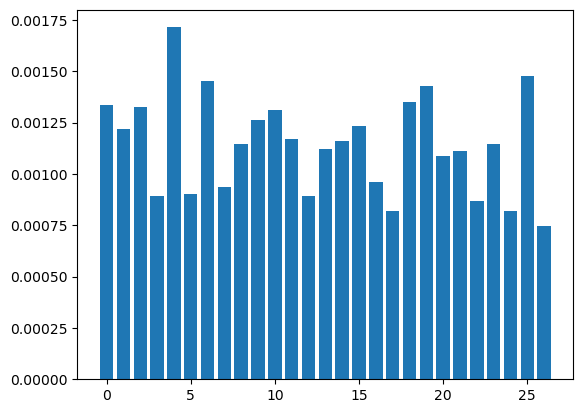

In [179]:
%%time

losses = []
criterion = nn.MSELoss()
for idx, img in enumerate(test):
    x = torch.Tensor(np.reshape(img[0], (1, 1, 256, 256, 256))).cuda()
    output = model(x)
    
    og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
    pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
    pred = np.sum(pred, axis=0)
    
    seg = test_segments[idx]
    full_seg = exclude_segments(seg, [1, 4, 5])
    
    losses.append(float(criterion(torch.Tensor(og * full_seg), torch.Tensor(pred * full_seg))))

plt.bar(range(0, len(losses)), losses)

SSIM:  0.9290449690354131


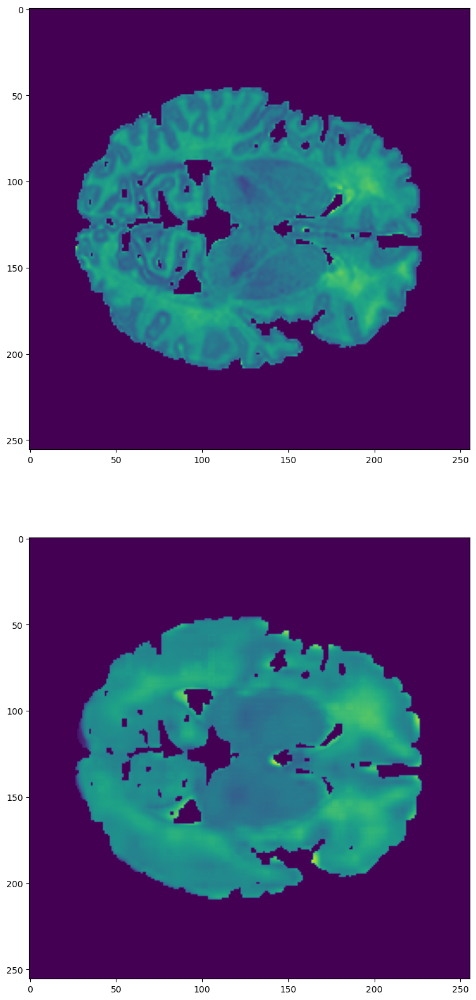

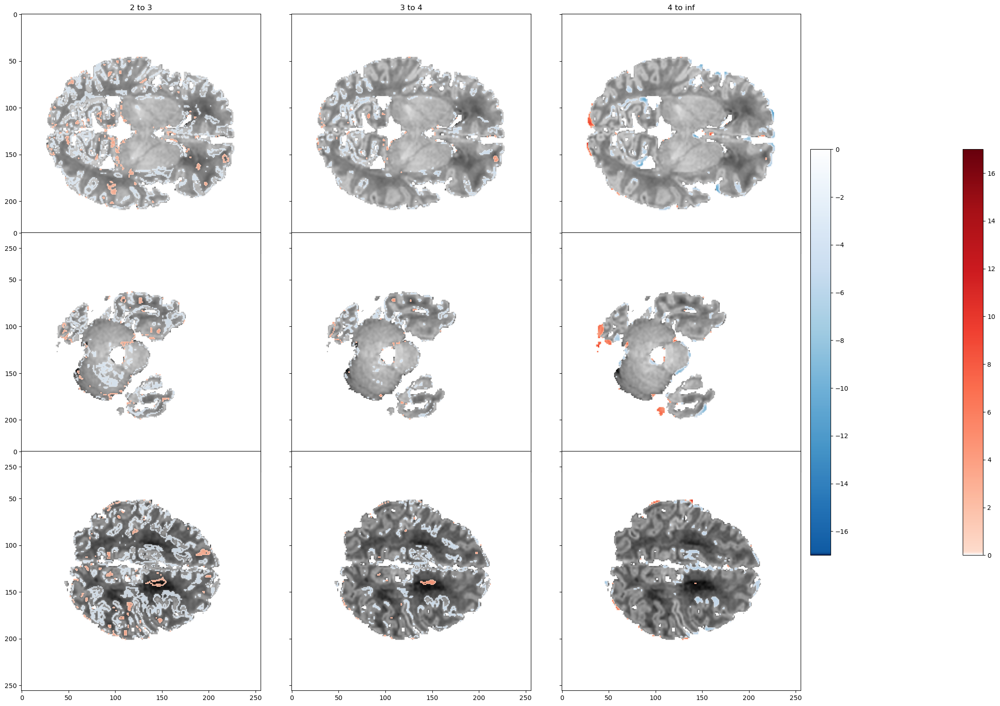

In [36]:
index = 5
x = torch.Tensor(np.reshape(test[index][0], (1, 1, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred = np.sum(pred, axis=0)

s = 128

# exclude csf and background
seg = test_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)


fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og * full_seg, pred * full_seg)

SSIM:  0.8888285714349179


D:\school\research\code\explore_again\modeling\vae\visualization.py:155: UserWarning: Trying to register the cmap 'above_mean2' which already exists.
  plt.register_cmap(cmap=map_object)
D:\school\research\code\explore_again\modeling\vae\visualization.py:162: UserWarning: Trying to register the cmap 'below_mean2' which already exists.
  plt.register_cmap(cmap=map_object)


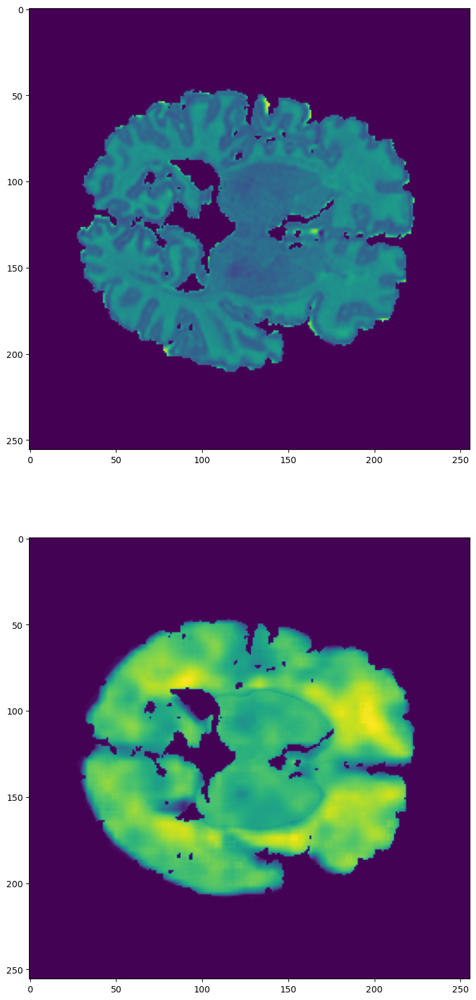

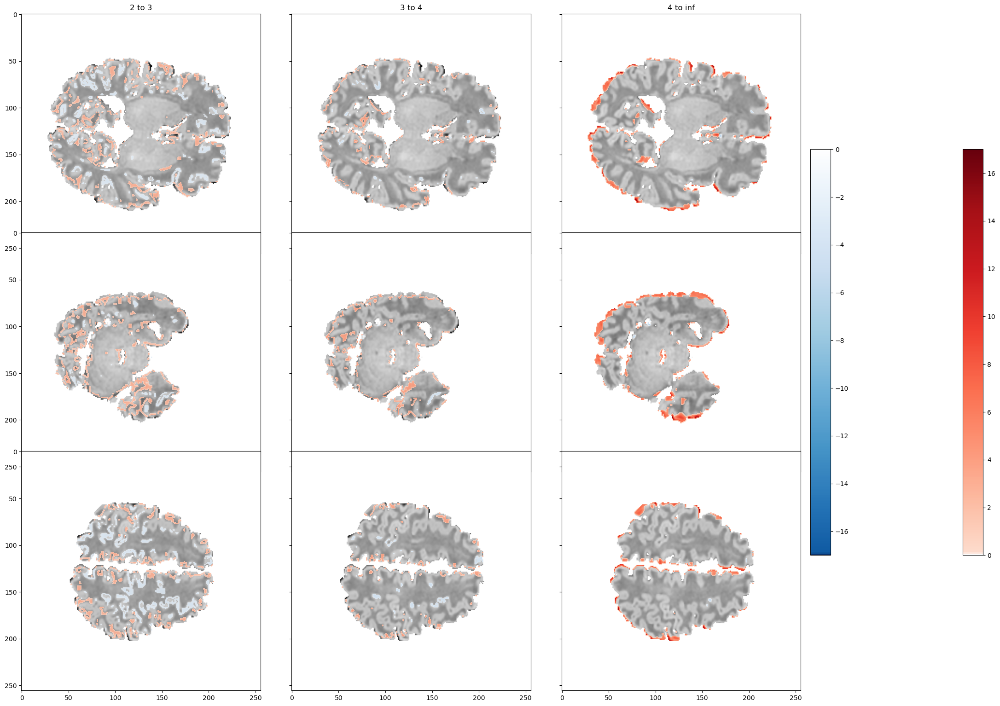

In [67]:
### THIS METHOD EXCLUDES THE SEGMENTED OUTPUT SLICES SO THAT SIGNAL IS NOT PART OF HTE DIFFERENCE

index = 6
x = torch.Tensor(np.reshape(test[index][0], (1, 1, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred_all = np.sum(pred, axis=0)
pred = np.delete(pred, [0, 3, 4], axis=0)
pred = np.sum(pred, axis=0)

s = 128

# exclude csf and background
seg = test_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)

fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og * full_seg, pred * full_seg)

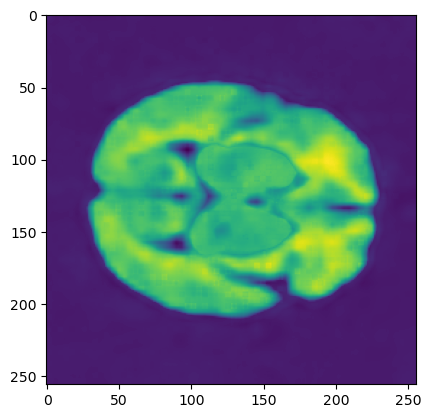

In [62]:
plt.imshow(pred[:,:,128])

### Run on L5 from first dHCP pass

In [25]:
dhcp_l5 = np.load(r"F:\Research\Data\dHCP\standardized\dhcp_level5.npy")
dhcp_l5.shape

(8, 256, 256, 256)

SSIM:  0.9273450084523335


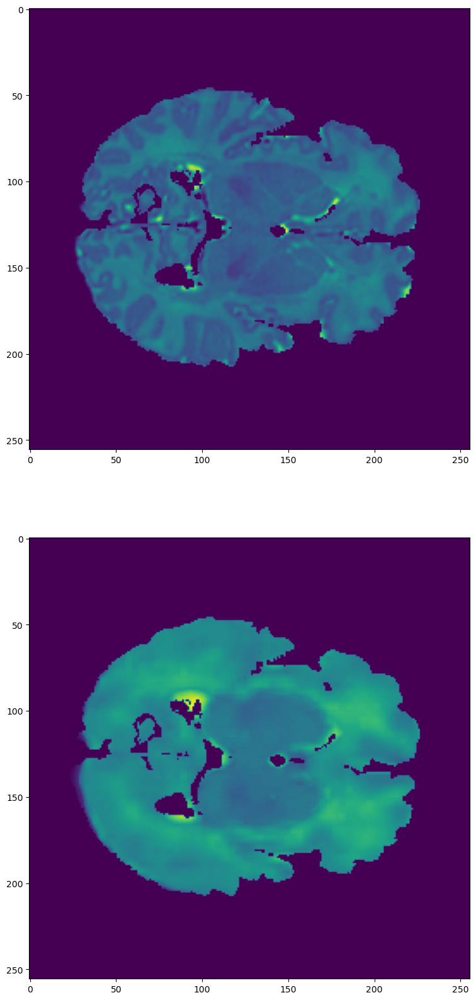

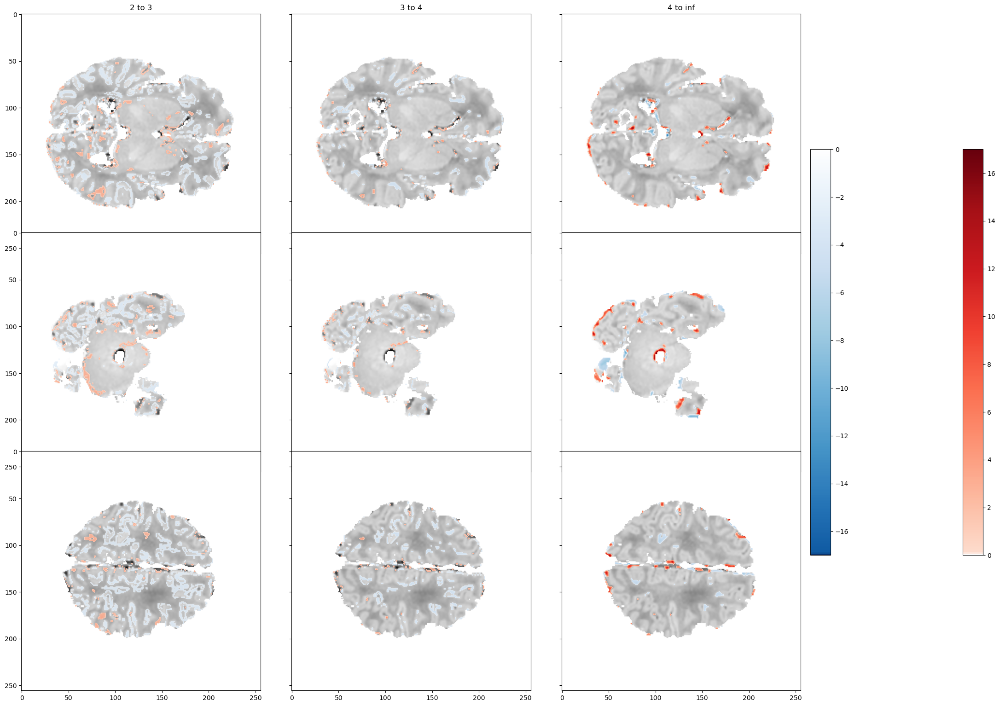

In [29]:
index = 0
x = torch.Tensor(np.reshape(dhcp_l5[index], (1, 1, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
pred = np.sum(pred, axis=0)

s = 128
# og_slc= og[:,:,s]
# pred_slc = pred[:,:,s]

seg = test_segments[index]
seg_slice = exclude_segments(seg[:,:,s], [1, 4, 5])
og_slc = og[:,:,s] * seg_slice
pred_slc = pred[:,:,s] * seg_slice

(score, diff) = ssim(og_slc, pred_slc, full=True)
print("SSIM: ", score)


fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(og_slc)
ax[1].imshow(pred_slc)

full_seg = exclude_segments(seg, [1, 4, 5])
viz_slices(og * full_seg, pred * full_seg)

### Assess Some Results

In [40]:
index = 0
x = torch.Tensor(np.reshape(train[index][0], (1, 1, 256, 256, 256))).cuda()
output = model(x)

# og = np.reshape(x.cpu().detach().numpy(), (256, 256, 256))
og = np.reshape(train[index][1], (9, 256, 256, 256))
res = np.reshape(output.cpu().detach().numpy(), (9, 256, 256, 256))
# pred = np.sum(pred, axis=0)

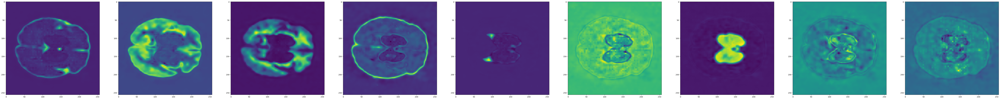

In [44]:
fig, ax = plt.subplots(1, 9, figsize=(100,20))

for i in range(0, 9):
    ax[i].imshow(res[i][:,:,128])

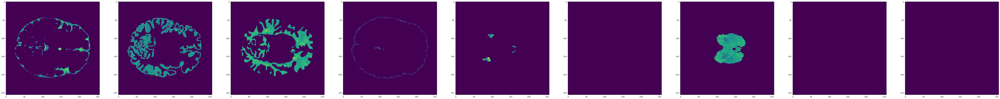

In [45]:
fig, ax = plt.subplots(1, 9, figsize=(100,20))

for i in range(0, 9):
    ax[i].imshow(og[i][:,:,128])

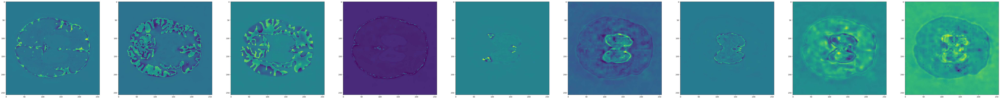

In [46]:
fig, ax = plt.subplots(1, 9, figsize=(100,20))

for i in range(0, 9):
    ax[i].imshow(og[i][:,:,128] - res[i][:,:,128])

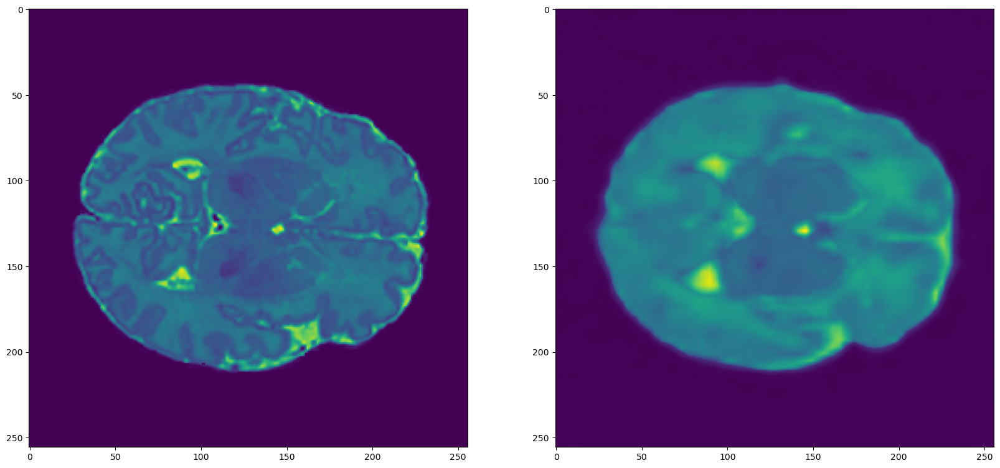

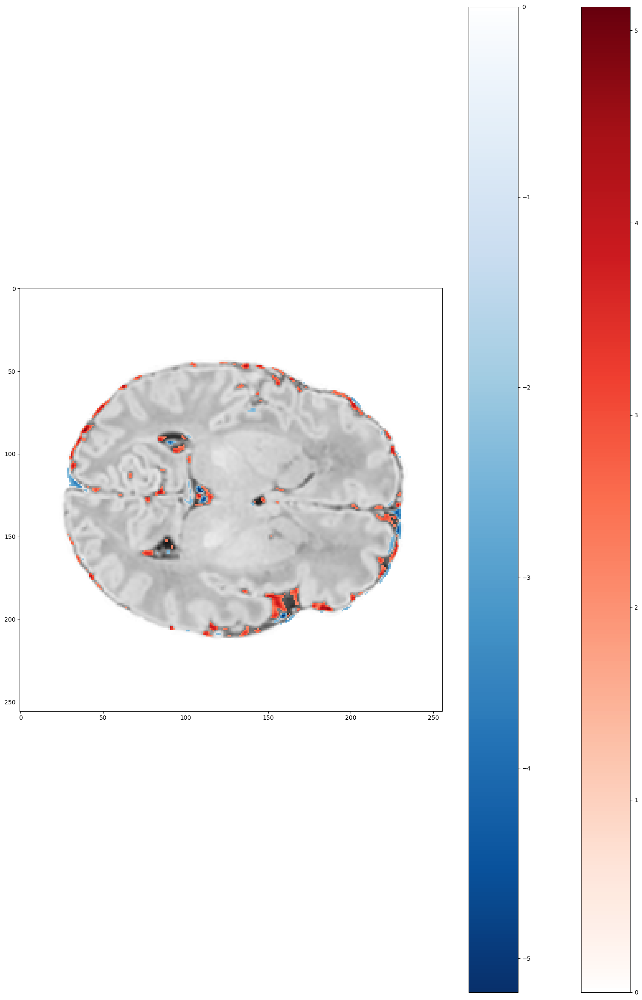

In [22]:
fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(np.sum(og[:,:,:,128], axis=0))
ax[1].imshow(np.sum(res[:,:,:,128], axis=0))

brain_diff(np.sum(og[:,:,:,128], axis=0), np.sum(res[:,:,:,128], axis=0), threshold=2)

In [69]:
og.shape

(9, 256, 256, 256)

D:\school\research\code\explore_again\modeling\vae\visualization.py:87: UserWarning: Trying to register the cmap 'above_mean' which already exists.
  plt.register_cmap(cmap=map_object)
D:\school\research\code\explore_again\modeling\vae\visualization.py:94: UserWarning: Trying to register the cmap 'below_mean' which already exists.
  plt.register_cmap(cmap=map_object)


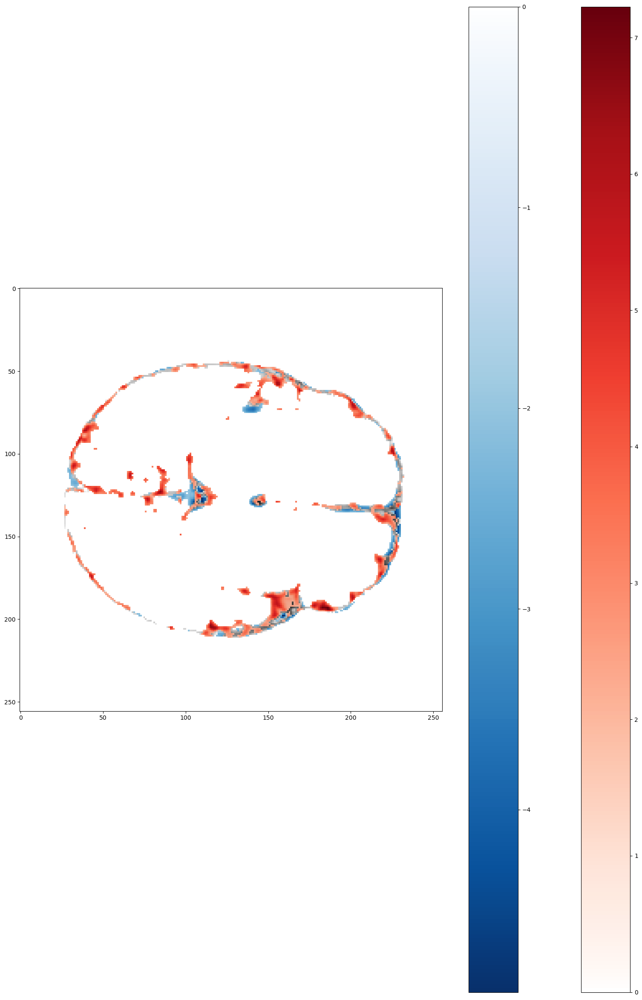

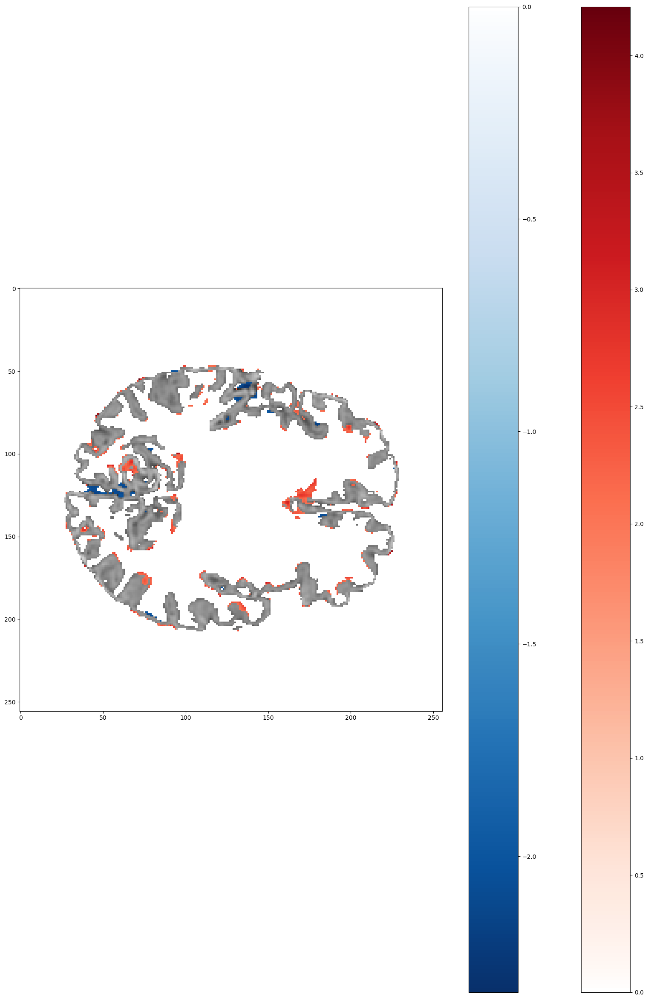

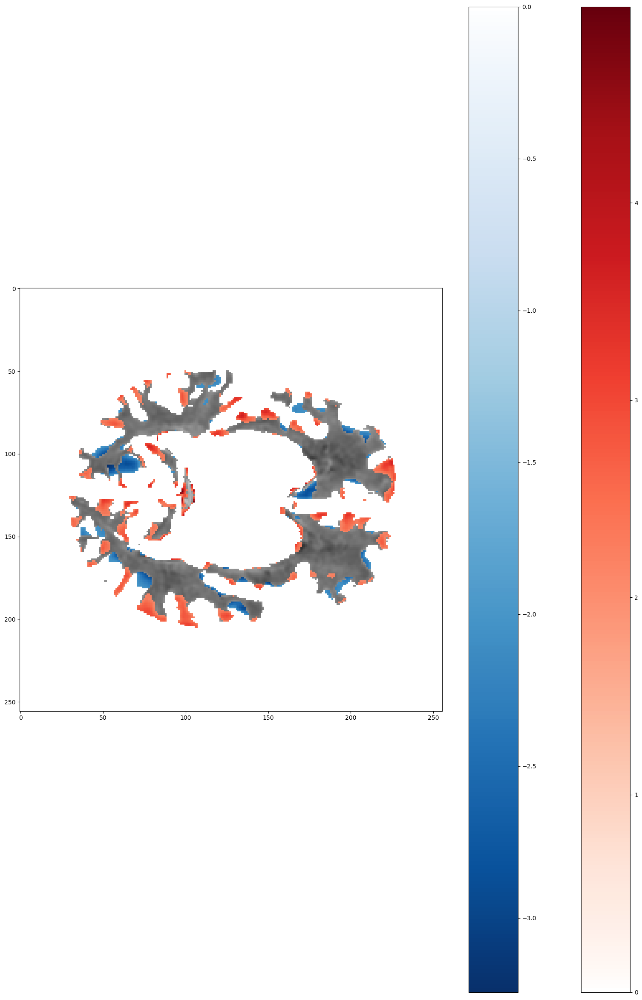

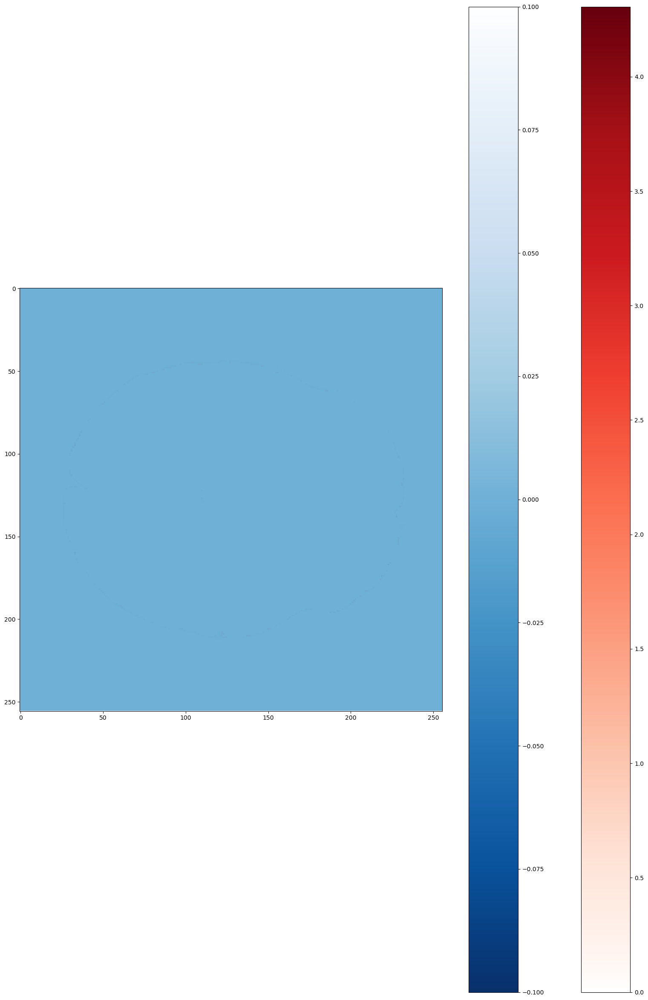

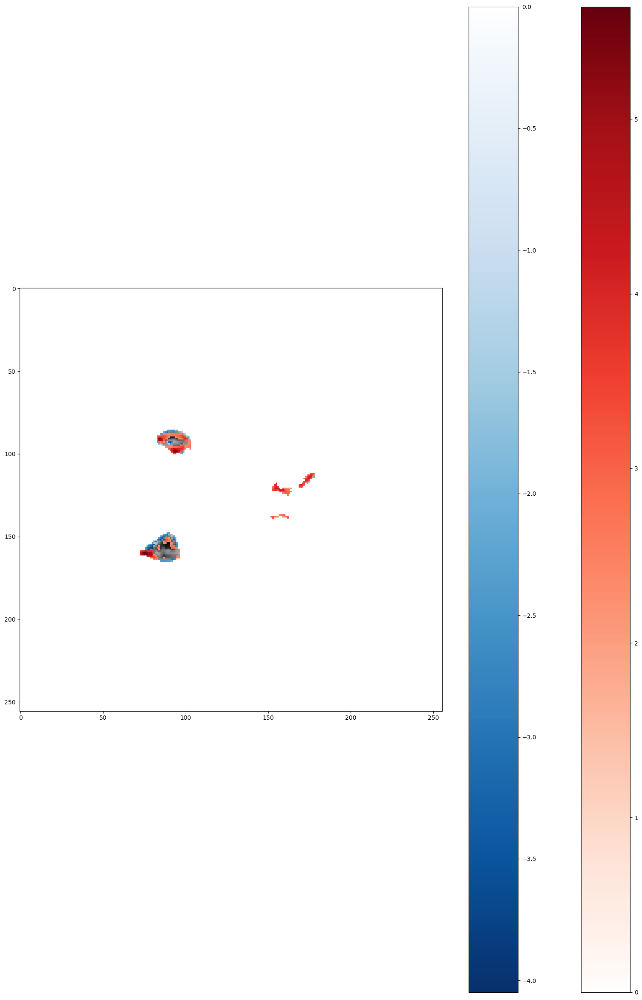

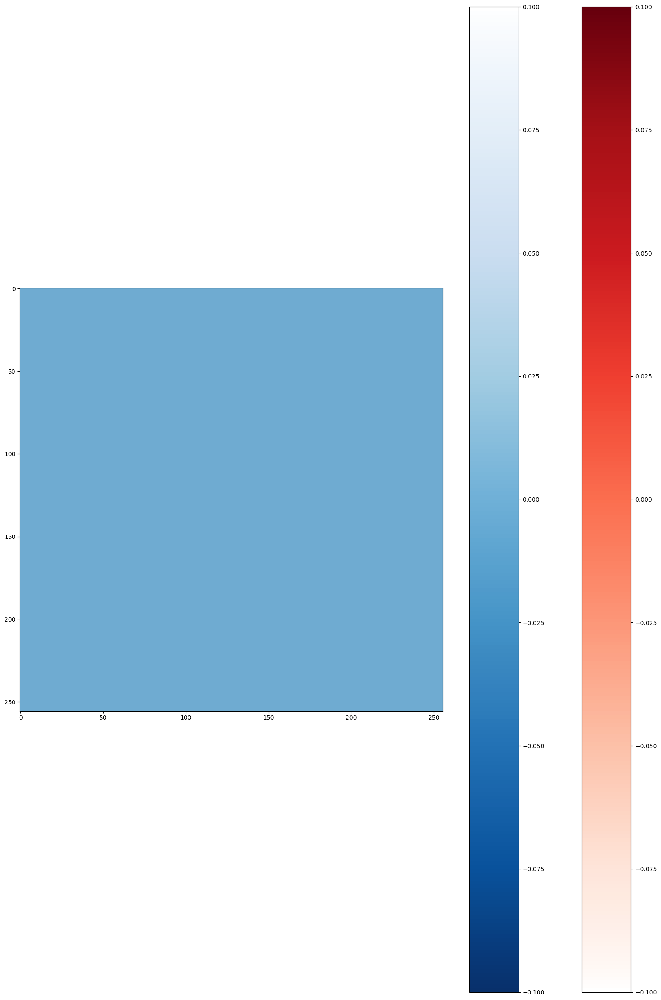

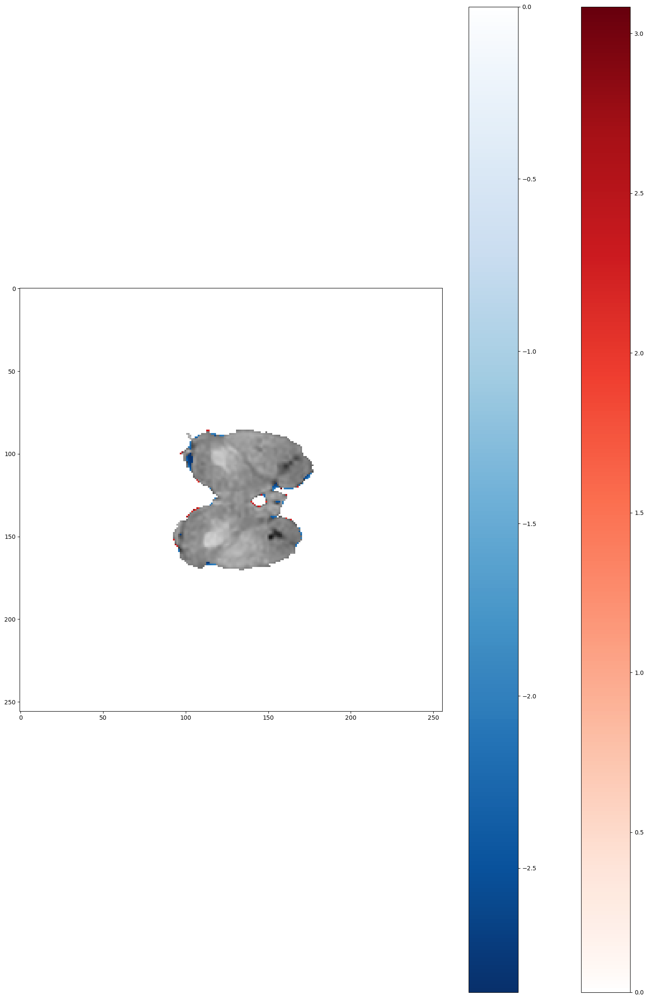

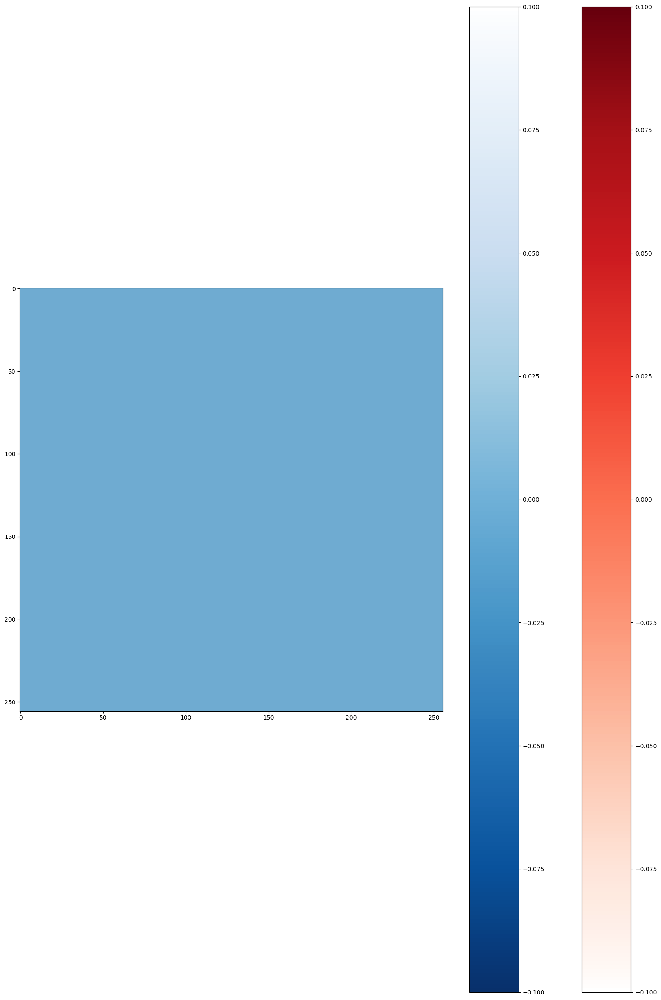

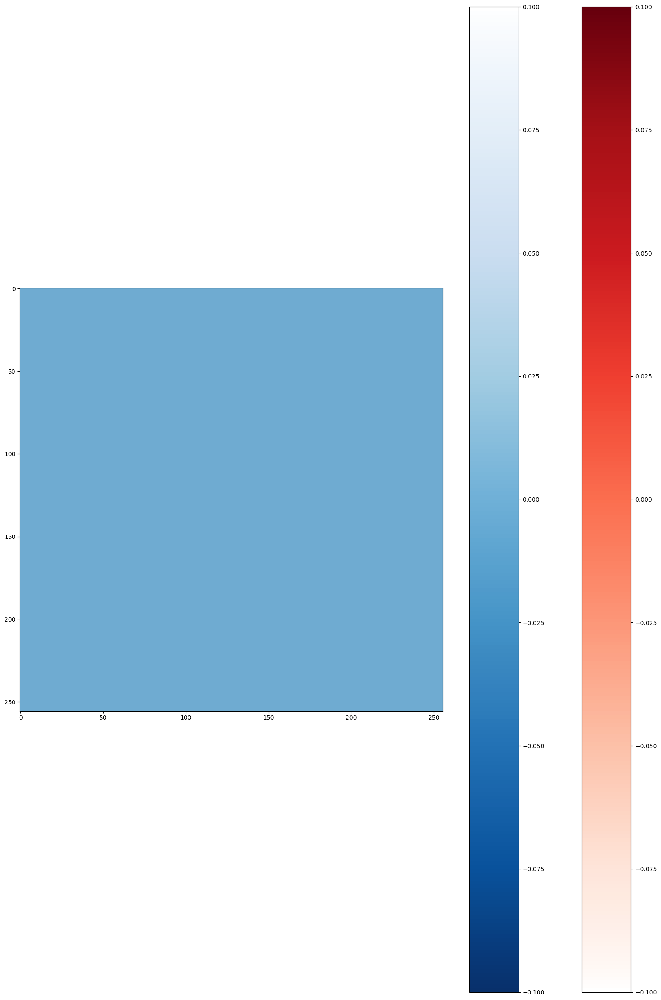

In [23]:
for m in range(0, 9):
    brain_diff(og[m][:,:,128], res[m][:,:,128], threshold=2)